In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 2: INSTALAR DEPENDENCIAS
# ─────────────────────────────────────────────────────────────────────────────
!pip -q install netCDF4 gdal matplotlib cartopy pillow boto3 shapely pyproj

# Dependencias adicionales para cartopy en Linux
!apt-get install -y libproj-dev proj-data proj-bin
!apt-get install -y libgeos-dev

# Reinstalar cartopy con soporte completo
!pip uninstall -y cartopy
!pip -q install --no-binary cartopy cartopy

print("✅ Todas las dependencias instaladas")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.0/140.0 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.2/90.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.5 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libproj-dev is already the newest version (9.3.1-1~jammy0).
libproj-dev set to manually installed.
proj-data is already the newest version (9.3.1-1~jammy0).
proj-data set to manually installed.
The following NEW packages will be installed:
  proj-bin
0 upgraded, 1 newly installed, 0 to remove and 1 not upgraded.
Need to get 205 kB of archives.
After this operation, 521 kB of additional disk space will be used.
Get:1 https://ppa

# **OPCION 1 :** DESCARGA AUTOMATICA DE GOES 19 DE LA BANDA TEMPERATURA DE BRILLO :

In [ ]:
# Download da arquivo CPT exemplo (para realce de canais IR)
!wget -c https://www.dropbox.com/s/fdgnaqt91cy3x97/IR4AVHRR6.cpt
print('\n')

# Download da arquivo CPT exemplo (para realce de canais WV)
!wget -c https://www.dropbox.com/s/4l9fys6pv5c68xk/SVGAWVX_TEMP.cpt
print('\n')

--2026-06-23 22:32:33--  https://www.dropbox.com/s/fdgnaqt91cy3x97/IR4AVHRR6.cpt
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/xnvefxd22g3b96e2yl8i6/IR4AVHRR6.cpt?rlkey=rdxakz4tkmb3ghf87o3v6enc1 [following]
--2026-06-23 22:32:33--  https://www.dropbox.com/scl/fi/xnvefxd22g3b96e2yl8i6/IR4AVHRR6.cpt?rlkey=rdxakz4tkmb3ghf87o3v6enc1
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf0778f0dedf18765e0e5fafdb4.dl.dropboxusercontent.com/cd/0/inline/DC-fm5ncJf-CrBgJGMCGhyo4OKs-YfXieNVQ8BJi16Dq6szVAnDtPPwui2czqM4L3HiaCnGxGxG6gCxFkyVYpiwAsC4Tb-gGkiDnFMKuSLZMX1tdakh1sMtgKwYkkkPzXj8/file# [following]
--2026-06-23 22:32:34--  https://ucf0778f0dedf18765e0e5fafdb4.dl.dropboxusercontent.com/cd/0/inline/DC-fm5ncJf-CrBgJGMC

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 2 (DEFINITIVA) - SUBIR utilities_2.py MANUALMENTE
# ─────────────────────────────────────────────────────────────────────────────
from google.colab import files
import shutil
from pathlib import Path

# Subir el archivo desde la PC
print("📁 Por favor, selecciona el archivo 'utilities_2.py' desde tu computadora:")
uploaded = files.upload()

# Mover a /content/utilities_2.py
dest_path = Path("/content/utilities_2.py")
for filename in uploaded.keys():
    if filename == "utilities_2.py":
        shutil.move(filename, str(dest_path))
        print(f"✅ utilities_2.py guardado en {dest_path}")
        break
else:
    print("❌ No se subió el archivo utilities_2.py. Asegúrate de seleccionar el archivo correcto.")

# Verificar que sea un archivo Python válido (que no contenga HTML)
if dest_path.exists():
    with open(dest_path, 'r') as f:
        first_line = f.readline().strip()
        if first_line.startswith("<!DOCTYPE") or first_line.startswith("<html"):
            print("❌ El archivo subido parece HTML, no Python. Por favor, sube el archivo correcto.")
            dest_path.unlink()  # eliminar el archivo incorrecto
        else:
            print("✅ El archivo parece válido.")

📁 Por favor, selecciona el archivo 'utilities_2.py' desde tu computadora:


Saving utilities_2.py to utilities_2.py
✅ utilities_2.py guardado en /content/utilities_2.py
✅ El archivo parece válido.


In [ ]:
import sys
sys.path.insert(0, "/content")
from utilities_2 import download_CMI, reproject, loadCPT

In [ ]:
import numpy as np
from netCDF4 import Dataset
from osgeo import gdal
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('Agg')
import cartopy, cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
from matplotlib import cm
from datetime import timedelta, datetime
from pathlib import Path
from PIL import Image
import os
import tempfile
import sys
from utilities_2 import download_CMI, reproject, loadCPT

# Configurar GDAL
gdal.UseExceptions()

# Crear directorios temporales
BASE_DIR = Path(tempfile.mkdtemp())
input_dir = BASE_DIR / "Samples" / datetime.now().strftime('%Y-%m-%d')
output_dir = BASE_DIR / "Output" / datetime.now().strftime('%Y-%m-%d')
input_dir.mkdir(parents=True, exist_ok=True)
output_dir.mkdir(parents=True, exist_ok=True)

print(f"📁 Directorio temporal: {BASE_DIR}")

# ── Config ────────────────────────────────────────────────────────────────────
extent = [-93.0, -60.0, -25.0, 18.0]
N_IMAGES = 5
GIF_DELAY = 1000
BAND = 13
MAX_H_BACK = 6

# ─────────────────────────────────────────────────────────────────────────────
# VALIDADOR
# ─────────────────────────────────────────────────────────────────────────────
def _is_valid(result) -> bool:
    if result is None:
        return False
    if isinstance(result, int):
        return result >= 0
    if isinstance(result, str):
        try:
            return int(result) >= 0
        except ValueError:
            return result.strip() != ""
    return False

# ─────────────────────────────────────────────────────────────────────────────
# RECOLECTAR IMÁGENES
# ─────────────────────────────────────────────────────────────────────────────
def collect_latest_images(band: int, dest: Path, n: int = 5, max_hours_back: int = 6) -> list[str]:
    now = datetime.utcnow()
    found = []
    tried = set()

    for minutes_back in range(0, max_hours_back * 60 + 1, 10):
        if len(found) == n:
            break

        candidate = now - timedelta(minutes=minutes_back)
        minute_r = (candidate.minute // 10) * 10
        yyyymmddhhmn = candidate.strftime('%Y%m%d%H') + f'{minute_r:02d}'

        if yyyymmddhhmn in tried:
            continue
        tried.add(yyyymmddhhmn)

        print(f"  [{len(found)+1}/{n}] Probando {yyyymmddhhmn} UTC ...", end=" ", flush=True)
        result = download_CMI(yyyymmddhhmn, band, str(dest))

        if _is_valid(result):
            print(f"✓  {result}")
            found.append(result)
        else:
            print("✗")

    if not found:
        raise RuntimeError(f"No se encontró ninguna imagen en las últimas {max_hours_back} horas.")

    if len(found) < n:
        print(f"\n⚠ Solo se encontraron {len(found)} imágenes (se pedían {n}).")

    return list(reversed(found))

# ─────────────────────────────────────────────────────────────────────────────
# PROCESAR NC
# ─────────────────────────────────────────────────────────────────────────────
def process_nc(file_name: str) -> tuple:
    var = 'CMI'
    nc_path = str(input_dir / f"{file_name}.nc")
    img = gdal.Open(f'NETCDF:{nc_path}:{var}')

    if img is None:
        raise FileNotFoundError(f"GDAL no pudo abrir: {nc_path}")

    metadata = img.GetMetadata()
    scale = float(metadata[var + '#scale_factor'])
    offset = float(metadata[var + '#add_offset'])
    undef = float(metadata[var + '#_FillValue'])
    dtime = metadata['NC_GLOBAL#time_coverage_start']

    ds_cmi = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)
    ds_cmi = (ds_cmi * scale + offset) - 273.15

    filename_ret = str(output_dir / f"IR_{file_name}.nc")
    reproject(filename_ret, img, ds_cmi, extent, undef)

    nc_repr = Dataset(filename_ret)
    data = nc_repr.variables['Band1'][:]
    dt = datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')

    return data, dt

# ─────────────────────────────────────────────────────────────────────────────
# GENERAR FRAME
# ─────────────────────────────────────────────────────────────────────────────
def make_frame(data, dt: datetime, frame_idx: int, cmap, shp_path: str) -> Path:
    fig = plt.figure(figsize=(12, 12), dpi=120)
    ax = plt.axes(projection=ccrs.PlateCarree())

    img_extent = [extent[0], extent[2], extent[1], extent[3]]
    ax.set_extent(img_extent, ccrs.PlateCarree())

    img1 = ax.imshow(data, origin='upper', vmin=-103.0, vmax=84,
                     extent=img_extent, cmap=cmap, alpha=1.0)

    try:
        if shp_path and Path(shp_path).exists():
            shapefile = list(shpreader.Reader(shp_path).geometries())
            ax.add_geometries(shapefile, ccrs.PlateCarree(),
                             edgecolor='white', facecolor='none', linewidth=0.3)
    except:
        pass

    ax.coastlines(resolution='10m', color='white', linewidth=0.8)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0,
                      linestyle='--', linewidth=0.25,
                      xlocs=np.arange(-180, 180, 5),
                      ylocs=np.arange(-90, 90, 5),
                      draw_labels=True)
    gl.top_labels = False
    gl.right_labels = False

    plt.colorbar(img1, label='Brightness Temperatures (°C)',
                 extend='both', orientation='vertical', pad=0.03, fraction=0.05)

    plt.title(f'GOES-19 Band 13  {dt.strftime("%Y-%m-%d %H:%M")} UTC',
              fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent), fontsize=10, loc='right')

    out_path = output_dir / f"frame_{frame_idx:02d}_{dt.strftime('%Y%m%d%H%M')}.png"
    plt.savefig(str(out_path), bbox_inches='tight', pad_inches=0)
    plt.close(fig)
    return out_path

# ─────────────────────────────────────────────────────────────────────────────
# MAIN
# ─────────────────────────────────────────────────────────────────────────────
if __name__ == '__main__':

    # 1. Crear paleta de colores
    print("🎨 Creando paleta de colores...")
    cpt_path = '/content/IR4AVHRR6.cpt'
    cpt = loadCPT(str(cpt_path))
    cmap = cm.colors.LinearSegmentedColormap('cpt', cpt)

    # 2. Shapefile (opcional)
    shp_path = None
    shp_dir = BASE_DIR / 'shapefile'
    shp_dir.mkdir(exist_ok=True)
    shp_file = shp_dir / 'Limite_departamentos_actual23.shp'

    try:
        import requests
        url = "https://raw.githubusercontent.com/juaneladio/peru-geojson/master/peru_departamental_simple.geojson"
        response = requests.get(url)
        if response.status_code == 200:
            with open(shp_file, 'w') as f:
                f.write(response.text)
            shp_path = str(shp_file)
            print(f"✅ Shapefile descargado")
    except:
        print("⚠️ No se pudo descargar shapefile, continuando sin él")

    # 3. Recolectar archivos
    print(f"\n=== Buscando las {N_IMAGES} imágenes más recientes de GOES-19 Band-{BAND} ===\n")
    files = collect_latest_images(BAND, input_dir, n=N_IMAGES, max_hours_back=MAX_H_BACK)
    print(f"\n→ {len(files)} imágenes recolectadas.\n")

    # 4. Generar frames
    print("=== Generando frames ===")
    frame_paths = []
    for i, fname in enumerate(files):
        print(f"  Frame {i+1}/{len(files)}: {fname} ...", end=" ", flush=True)
        data, dt = process_nc(fname)
        path = make_frame(data, dt, i + 1, cmap, shp_path)
        frame_paths.append(path)
        print(f"✓  guardado → {path.name}")

    # 5. Ensamblar GIF
    print("\n=== Ensamblando GIF ===")
    gif_path = output_dir / f"GOES19_B{BAND}_animation.gif"

    frames_pil = [Image.open(str(p)).convert('RGB') for p in frame_paths]

    frames_pil[0].save(
        str(gif_path),
        save_all=True,
        append_images=frames_pil[1:],
        duration=GIF_DELAY,
        loop=0,
        optimize=False,
    )

    print(f"✅ GIF guardado en: {gif_path}")
    print(f"  {len(frame_paths)} frames · {GIF_DELAY/1000:.1f} s/frame · loop infinito")

    # 6. Mostrar GIF
    from IPython.display import Image as IPImage, display
    display(IPImage(str(gif_path)))

SyntaxError: invalid syntax (utilities_2.py, line 1)

# **OPCION 2** DESCARGA AUTOMATICA DE GOES 19 DE LA BANDA TEMPERATURA DE BRILLO

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 1 - CREAR DIRECTORIOS EN /content/GOES19_Data
# ─────────────────────────────────────────────────────────────────────────────
import os
from pathlib import Path
from datetime import datetime

# Directorio raíz donde se almacenarán todos los datos
ROOT_DIR = Path("/content/GOES19_Data2")
ROOT_DIR.mkdir(parents=True, exist_ok=True)

# Subdirectorios
SAMPLES_DIR = ROOT_DIR / "Samples" / datetime.now().strftime('%Y-%m-%d')
OUTPUT_DIR  = ROOT_DIR / "Output"  / datetime.now().strftime('%Y-%m-%d')
SHAPEFILE_DIR = ROOT_DIR / "shapefile"
CPT_DIR = ROOT_DIR / "cpt"   # para guardar los archivos .cpt

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
SHAPEFILE_DIR.mkdir(parents=True, exist_ok=True)
CPT_DIR.mkdir(parents=True, exist_ok=True)

print(f"📁 Directorio raíz: {ROOT_DIR}")
print(f"   - Descargas: {SAMPLES_DIR}")
print(f"   - Resultados: {OUTPUT_DIR}")
print(f"   - Shapefiles: {SHAPEFILE_DIR}")
print(f"   - Paletas CPT: {CPT_DIR}")

📁 Directorio raíz: /content/GOES19_Data2
   - Descargas: /content/GOES19_Data2/Samples/2026-08-19
   - Resultados: /content/GOES19_Data2/Output/2026-08-19
   - Shapefiles: /content/GOES19_Data2/shapefile
   - Paletas CPT: /content/GOES19_Data2/cpt


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 2 - DESCARGAR ARCHIVOS DE APOYO
# ─────────────────────────────────────────────────────────────────────────────
import os
import requests
import subprocess
from pathlib import Path

root_xd=Path("/content")
ROOT_DIR = Path("/content/GOES19_Data2")
CPT_DIR = ROOT_DIR / "cpt"
SHAPEFILE_DIR = ROOT_DIR / "shapefile"

# 1. Descargar IR4AVHRR6.cpt (paleta para IR)
cpt_url_ir = "https://www.dropbox.com/s/fdgnaqt91cy3x97/IR4AVHRR6.cpt?dl=1"
cpt_ir_path = CPT_DIR / "IR4AVHRR6.cpt"
if not cpt_ir_path.exists():
    print("📥 Descargando IR4AVHRR6.cpt ...")
    response = requests.get(cpt_url_ir)
    if response.status_code == 200:
        with open(cpt_ir_path, 'wb') as f:
            f.write(response.content)
        print(f"   ✅ Guardado en {cpt_ir_path}")
    else:
        print("   ❌ Error al descargar IR4AVHRR6.cpt")
else:
    print(f"✅ IR4AVHRR6.cpt ya existe en {cpt_ir_path}")


# ─────────────────────────────────────────────────────────────────────────────
# CELDA 2 (DEFINITIVA) - SUBIR utilities_2.py MANUALMENTE
# ─────────────────────────────────────────────────────────────────────────────
from google.colab import files
import shutil
from pathlib import Path

# Subir el archivo desde la PC
print("📁 Por favor, selecciona el archivo 'utilities_2.py' desde tu computadora:")
uploaded = files.upload()

# Mover a /content/utilities_2.py
dest_path = Path("/content/utilities_2.py")
for filename in uploaded.keys():
    if filename == "utilities_2.py":
        shutil.move(filename, str(dest_path))
        print(f"✅ utilities_2.py guardado en {dest_path}")
        break
else:
    print("❌ No se subió el archivo utilities_2.py. Asegúrate de seleccionar el archivo correcto.")

# Verificar que sea un archivo Python válido (que no contenga HTML)
if dest_path.exists():
    with open(dest_path, 'r') as f:
        first_line = f.readline().strip()
        if first_line.startswith("<!DOCTYPE") or first_line.startswith("<html"):
            print("❌ El archivo subido parece HTML, no Python. Por favor, sube el archivo correcto.")
            dest_path.unlink()  # eliminar el archivo incorrecto
        else:
            print("✅ El archivo parece válido.")

# 4. Descargar shapefile (Perú departamentos) – versión GeoJSON que funciona bien
shp_path = SHAPEFILE_DIR / "peru_departamental.geojson"
if not shp_path.exists():
    print("📥 Descargando shapefile de Perú (GeoJSON) ...")
    # Usar un GeoJSON de Perú válido desde un repositorio confiable
    shp_url = "https://raw.githubusercontent.com/juaneladio/peru-geojson/master/peru_departamental_simple.geojson"
    response = requests.get(shp_url)
    if response.status_code == 200:
        with open(shp_path, 'w', encoding='utf-8') as f:
            f.write(response.text)
        print(f"   ✅ Guardado en {shp_path}")
    else:
        print("   ❌ Error al descargar shapefile, se usará coastlines sin shapefile")
        shp_path = None
else:
    print(f"✅ shapefile ya existe en {shp_path}")

# Agregar el directorio raíz al sys.path para importar utilities_2
import sys
sys.path.insert(0, str(ROOT_DIR))


📥 Descargando IR4AVHRR6.cpt ...
   ✅ Guardado en /content/GOES19_Data2/cpt/IR4AVHRR6.cpt
📁 Por favor, selecciona el archivo 'utilities_2.py' desde tu computadora:


Saving utilities_2.py to utilities_2.py
✅ utilities_2.py guardado en /content/utilities_2.py
✅ El archivo parece válido.
📥 Descargando shapefile de Perú (GeoJSON) ...
   ✅ Guardado en /content/GOES19_Data2/shapefile/peru_departamental.geojson


📁 Directorio de datos: /content/GOES19_Data2
   - Descargas: /content/GOES19_Data2/Samples/2026-08-19
   - Resultados: /content/GOES19_Data2/Output/2026-08-19
✅ Shapefile encontrado en /content/GOES19_Data2/shapefile/peru_departamental.geojson

=== Buscando las 5 imágenes más recientes de GOES-19 Band-13 ===

  [1/5] Probando 202608192110 UTC ... No files found for the date: 202608192110, Band-13
✗
  [1/5] Probando 202608192100 UTC ... Downloading file /content/GOES19_Data2/Samples/2026-08-19/OR_ABI-L2-CMIPF-M6C13_G19_s20262312100204_e20262312109524_c20262312109580.nc
✓  OR_ABI-L2-CMIPF-M6C13_G19_s20262312100204_e20262312109524_c20262312109580
  [2/5] Probando 202608192050 UTC ... File /content/GOES19_Data2/Samples/2026-08-19/OR_ABI-L2-CMIPF-M6C13_G19_s20262312050204_e20262312059524_c20262312059569.nc exists
✓  OR_ABI-L2-CMIPF-M6C13_G19_s20262312050204_e20262312059524_c20262312059569
  [3/5] Probando 202608192040 UTC ... File /content/GOES19_Data2/Samples/2026-08-19/OR_ABI-L2-CMIPF-M6C

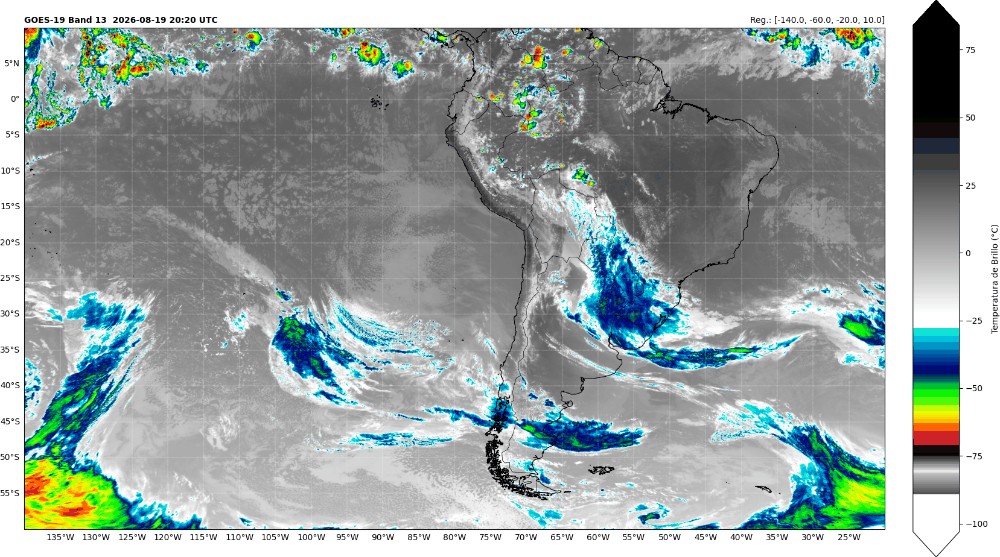

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 4 - SCRIPT PRINCIPAL
# ─────────────────────────────────────────────────────────────────────────────
import os
import sys
from pathlib import Path
from datetime import datetime, timedelta, timezone
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('Agg')
import cartopy, cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
from matplotlib import cm
from PIL import Image
from netCDF4 import Dataset
from osgeo import gdal

# Importar utilities_2 desde el directorio raíz
ROOT_DIR = Path("/content/GOES19_Data2")
sys.path.insert(0, str(ROOT_DIR))
from utilities_2 import download_CMI, reproject, loadCPT

# Configurar GDAL
gdal.UseExceptions()

# Directorios
SAMPLES_DIR = ROOT_DIR / "Samples" / datetime.now().strftime('%Y-%m-%d')
OUTPUT_DIR  = ROOT_DIR / "Output"  / datetime.now().strftime('%Y-%m-%d')
CPT_DIR     = ROOT_DIR / "cpt"
SHAPEFILE_DIR = ROOT_DIR / "shapefile"

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"📁 Directorio de datos: {ROOT_DIR}")
print(f"   - Descargas: {SAMPLES_DIR}")
print(f"   - Resultados: {OUTPUT_DIR}")

# ── Config ────────────────────────────────────────────────────────────────────
extent = [-140.0, -60.0, -20.0, 10.0]
N_IMAGES = 5
GIF_DELAY = 1000          # ms por frame
BAND = 13
MAX_H_BACK = 6            # horas máximas hacia atrás

# ─────────────────────────────────────────────────────────────────────────────
# VALIDADOR
# ─────────────────────────────────────────────────────────────────────────────
def _is_valid(result) -> bool:
    if result is None:
        return False
    if isinstance(result, int):
        return result >= 0
    if isinstance(result, str):
        try:
            return int(result) >= 0
        except ValueError:
            return result.strip() != ""
    return False

# ─────────────────────────────────────────────────────────────────────────────
# RECOLECTAR IMÁGENES
# ─────────────────────────────────────────────────────────────────────────────
def collect_latest_images(band: int, dest: Path, n: int = 15, max_hours_back: int = 6) -> list[str]:
    # Usar timezone-aware para evitar el deprecation warning
    now = datetime.now(timezone.utc)
    found = []
    tried = set()

    for minutes_back in range(0, max_hours_back * 60 + 1, 10):
        if len(found) == n:
            break

        candidate = now - timedelta(minutes=minutes_back)
        minute_r = (candidate.minute // 10) * 10
        yyyymmddhhmn = candidate.strftime('%Y%m%d%H') + f'{minute_r:02d}'

        if yyyymmddhhmn in tried:
            continue
        tried.add(yyyymmddhhmn)

        print(f"  [{len(found)+1}/{n}] Probando {yyyymmddhhmn} UTC ...", end=" ", flush=True)
        result = download_CMI(yyyymmddhhmn, band, str(dest))

        if _is_valid(result):
            print(f"✓  {result}")
            found.append(result)
        else:
            print("✗")

    if not found:
        raise RuntimeError(f"No se encontró ninguna imagen en las últimas {max_hours_back} horas.")

    if len(found) < n:
        print(f"\n⚠ Solo se encontraron {len(found)} imágenes (se pedían {n}).")

    return list(reversed(found))

# ─────────────────────────────────────────────────────────────────────────────
# PROCESAR NC
# ─────────────────────────────────────────────────────────────────────────────
def process_nc(file_name: str) -> tuple:
    var = 'CMI'
    nc_path = str(SAMPLES_DIR / f"{file_name}.nc")
    img = gdal.Open(f'NETCDF:{nc_path}:{var}')

    if img is None:
        raise FileNotFoundError(f"GDAL no pudo abrir: {nc_path}")

    metadata = img.GetMetadata()
    scale = float(metadata[var + '#scale_factor'])
    offset = float(metadata[var + '#add_offset'])
    undef = float(metadata[var + '#_FillValue'])
    dtime = metadata['NC_GLOBAL#time_coverage_start']

    ds_cmi = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)
    ds_cmi = (ds_cmi * scale + offset) - 273.15

    filename_ret = str(OUTPUT_DIR / f"IR_{file_name}.nc")
    reproject(filename_ret, img, ds_cmi, extent, undef)

    nc_repr = Dataset(filename_ret)
    data = nc_repr.variables['Band1'][:]
    dt = datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')

    return data, dt

# ─────────────────────────────────────────────────────────────────────────────
# GENERAR FRAME
# ─────────────────────────────────────────────────────────────────────────────
def make_frame(data, dt: datetime, frame_idx: int, cmap, shp_path: Path) -> Path:
    fig = plt.figure(figsize=(20, 15))#, dpi=120)
    ax = plt.axes(projection=ccrs.PlateCarree())

    img_extent = [extent[0], extent[2], extent[1], extent[3]]
    ax.set_extent(img_extent, ccrs.PlateCarree())

    img1 = ax.imshow(data, origin='upper', vmin=-103.0, vmax=84,
                     extent=img_extent, cmap=cmap, alpha=1.0)

    # Cargar shapefile si existe y es válido
    if shp_path is not None and shp_path.exists():
        try:
            # Intentar leer como GeoJSON (si es .geojson) o shapefile
            import json
            with open(shp_path, 'r') as f:
                geojson_data = json.load(f)
            # cartopy puede leer GeoJSON directamente con shpreader.Reader
            # Pero shpreader.Reader espera un archivo .shp, no .geojson.
            # Usaremos una alternativa: leer con fiona o simplemente agregar coastlines.
            # Para simplificar, usaremos solo coastlines y bordes.
            # Si prefieres usar un shapefile real, descarga un .shp.
            # Por ahora, mejor usamos coastlines + bordes de países.
            pass
        except Exception as e:
            print(f"   ⚠️ No se pudo cargar shapefile: {e}")

    # Agregar elementos geográficos (coastlines, bordes, etc.)
    ax.coastlines(resolution='10m', color='black', linewidth=0.8)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    # También podemos agregar departamentos si tenemos un shapefile válido,
    # pero para evitar errores, usamos solo lo básico.

    # Grilla
    gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0,
                      linestyle='--', linewidth=0.25,
                      xlocs=np.arange(-180, 180, 5),
                      ylocs=np.arange(-90, 90, 5),
                      draw_labels=True)
    gl.top_labels = False
    gl.right_labels = False

    plt.colorbar(img1, label='Temperatura de Brillo (°C)',
                 extend='both', orientation='vertical', pad=0.03,shrink=0.8, aspect=12, fraction=0.05)

    plt.title(f'GOES-19 Band 13  {dt.strftime("%Y-%m-%d %H:%M")} UTC',
              fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent), fontsize=10, loc='right')

    out_path = OUTPUT_DIR / f"frame_{frame_idx:02d}_{dt.strftime('%Y%m%d%H%M')}.png"
    plt.savefig(str(out_path), bbox_inches='tight', pad_inches=0)
    plt.close(fig)
    return out_path

# ─────────────────────────────────────────────────────────────────────────────
# MAIN
# ─────────────────────────────────────────────────────────────────────────────
if __name__ == '__main__':
    # 1. Cargar paleta de colores (asegurarse de que existe)
    cpt_path = CPT_DIR / "IR4AVHRR6.cpt"
    if not cpt_path.exists():
        raise FileNotFoundError(f"No se encontró el archivo CPT en {cpt_path}. "
                                "Asegúrate de haber ejecutado la Celda 2.")

    cpt = loadCPT(str(cpt_path))
    if cpt is None:
        raise ValueError(f"Error al cargar la paleta desde {cpt_path}. "
                         "El archivo podría estar corrupto.")

    cmap = cm.colors.LinearSegmentedColormap('cpt', cpt)

    # 2. Shapefile (opcional) - intentar cargar uno válido
    shp_path = SHAPEFILE_DIR / "peru_departamental.geojson"
    if not shp_path.exists():
        print("⚠️ Shapefile no encontrado, se usará solo coastlines.")
        shp_path = None
    else:
        print(f"✅ Shapefile encontrado en {shp_path}")

    # 3. Recolectar archivos
    print(f"\n=== Buscando las {N_IMAGES} imágenes más recientes de GOES-19 Band-{BAND} ===\n")
    files = collect_latest_images(BAND, SAMPLES_DIR, n=N_IMAGES, max_hours_back=MAX_H_BACK)
    print(f"\n→ {len(files)} imágenes recolectadas.\n")

    # 4. Generar frames
    print("=== Generando frames ===")
    frame_paths = []
    for i, fname in enumerate(files):
        print(f"  Frame {i+1}/{len(files)}: {fname} ...", end=" ", flush=True)
        data, dt = process_nc(fname)
        path = make_frame(data, dt, i + 1, cmap, shp_path)
        frame_paths.append(path)
        print(f"✓  guardado → {path.name}")

    # 5. Ensamblar GIF
    print("\n=== Ensamblando GIF ===")
    gif_path = OUTPUT_DIR / f"GOES19_B{BAND}_animation.gif"

    frames_pil = [Image.open(str(p)).convert('RGB') for p in frame_paths]

    frames_pil[0].save(
        str(gif_path),
        save_all=True,
        append_images=frames_pil[1:],
        duration=GIF_DELAY,
        loop=0,
        optimize=False,
    )

    print(f"✅ GIF guardado en: {gif_path}")
    print(f"  {len(frame_paths)} frames · {GIF_DELAY/1000:.1f} s/frame · loop infinito")

    # 6. Mostrar GIF
    from IPython.display import Image as IPImage, display
    display(IPImage(str(gif_path)))

# LOCAL

In [ ]:
import json
from shapely.geometry import shape
from cartopy.feature import ShapelyFeature

📁 Directorio de datos: /content/GOES19_Data2
   - Descargas: /content/GOES19_Data2/Samples/2026-07-05
   - Resultados: /content/GOES19_Data2/Output/2026-07-05
✅ Shapefile encontrado en /content/GOES19_Data2/shapefile/peru_departamental.geojson

=== Buscando las 5 imágenes más recientes de GOES-19 Band-13 ===

  [1/5] Probando 202607050150 UTC ... No files found for the date: 202607050150, Band-13
✗
  [1/5] Probando 202607050140 UTC ... File /content/GOES19_Data2/Samples/2026-07-05/OR_ABI-L2-CMIPF-M6C13_G19_s20261860140214_e20261860149535_c20261860149598.nc exists
✓  OR_ABI-L2-CMIPF-M6C13_G19_s20261860140214_e20261860149535_c20261860149598
  [2/5] Probando 202607050130 UTC ... File /content/GOES19_Data2/Samples/2026-07-05/OR_ABI-L2-CMIPF-M6C13_G19_s20261860130214_e20261860139534_c20261860139574.nc exists
✓  OR_ABI-L2-CMIPF-M6C13_G19_s20261860130214_e20261860139534_c20261860139574
  [3/5] Probando 202607050120 UTC ... File /content/GOES19_Data2/Samples/2026-07-05/OR_ABI-L2-CMIPF-M6C13_G1

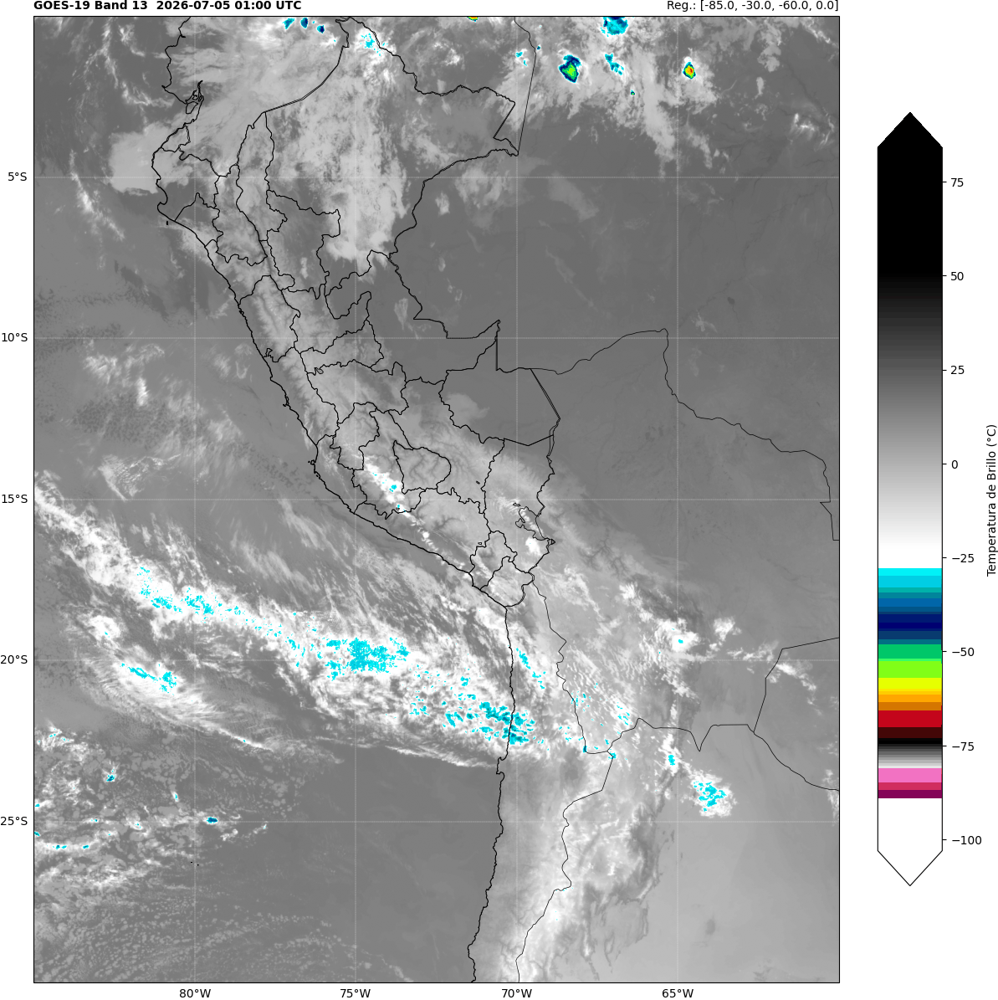

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# CELDA 4 - SCRIPT PRINCIPAL
# ─────────────────────────────────────────────────────────────────────────────
# Importar utilities_2 desde el directorio raíz
ROOT_DIR = Path("/content/GOES19_Data2")
sys.path.insert(0, str(ROOT_DIR))
from utilities_2 import download_CMI, reproject, loadCPT

# Configurar GDAL
gdal.UseExceptions()

# Directorios
SAMPLES_DIR = ROOT_DIR / "Samples" / datetime.now().strftime('%Y-%m-%d')
OUTPUT_DIR  = ROOT_DIR / "Output"  / datetime.now().strftime('%Y-%m-%d')
CPT_DIR     = ROOT_DIR / "cpt"
SHAPEFILE_DIR = ROOT_DIR / "shapefile"

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"📁 Directorio de datos: {ROOT_DIR}")
print(f"   - Descargas: {SAMPLES_DIR}")
print(f"   - Resultados: {OUTPUT_DIR}")

# ── Config ────────────────────────────────────────────────────────────────────
extent = [-85.0, -30.0, -60.0, 0.0]
N_IMAGES = 5
GIF_DELAY = 1000          # ms por frame
BAND = 13
MAX_H_BACK = 6            # horas máximas hacia atrás

# ─────────────────────────────────────────────────────────────────────────────
# VALIDADOR
# ─────────────────────────────────────────────────────────────────────────────
def _is_valid(result) -> bool:
    if result is None:
        return False
    if isinstance(result, int):
        return result >= 0
    if isinstance(result, str):
        try:
            return int(result) >= 0
        except ValueError:
            return result.strip() != ""
    return False

# ─────────────────────────────────────────────────────────────────────────────
# RECOLECTAR IMÁGENES
# ─────────────────────────────────────────────────────────────────────────────
def collect_latest_images(band: int, dest: Path, n: int = 15, max_hours_back: int = 6) -> list[str]:
    # Usar timezone-aware para evitar el deprecation warning
    now = datetime.now(timezone.utc)
    found = []
    tried = set()

    for minutes_back in range(0, max_hours_back * 60 + 1, 10):
        if len(found) == n:
            break

        candidate = now - timedelta(minutes=minutes_back)
        minute_r = (candidate.minute // 10) * 10
        yyyymmddhhmn = candidate.strftime('%Y%m%d%H') + f'{minute_r:02d}'

        if yyyymmddhhmn in tried:
            continue
        tried.add(yyyymmddhhmn)

        print(f"  [{len(found)+1}/{n}] Probando {yyyymmddhhmn} UTC ...", end=" ", flush=True)
        result = download_CMI(yyyymmddhhmn, band, str(dest))

        if _is_valid(result):
            print(f"✓  {result}")
            found.append(result)
        else:
            print("✗")

    if not found:
        raise RuntimeError(f"No se encontró ninguna imagen en las últimas {max_hours_back} horas.")

    if len(found) < n:
        print(f"\n⚠ Solo se encontraron {len(found)} imágenes (se pedían {n}).")

    return list(reversed(found))

# ─────────────────────────────────────────────────────────────────────────────
# PROCESAR NC
# ─────────────────────────────────────────────────────────────────────────────
def process_nc(file_name: str) -> tuple:
    var = 'CMI'
    nc_path = str(SAMPLES_DIR / f"{file_name}.nc")
    img = gdal.Open(f'NETCDF:{nc_path}:{var}')

    if img is None:
        raise FileNotFoundError(f"GDAL no pudo abrir: {nc_path}")

    metadata = img.GetMetadata()
    scale = float(metadata[var + '#scale_factor'])
    offset = float(metadata[var + '#add_offset'])
    undef = float(metadata[var + '#_FillValue'])
    dtime = metadata['NC_GLOBAL#time_coverage_start']

    ds_cmi = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)
    ds_cmi = (ds_cmi * scale + offset) - 273.15

    filename_ret = str(OUTPUT_DIR / f"IR_{file_name}.nc")
    reproject(filename_ret, img, ds_cmi, extent, undef)

    nc_repr = Dataset(filename_ret)
    data = nc_repr.variables['Band1'][:]
    dt = datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')

    return data, dt

# ─────────────────────────────────────────────────────────────────────────────
# GENERAR FRAME
# ─────────────────────────────────────────────────────────────────────────────
def make_frame(data, dt: datetime, frame_idx: int, cmap, shp_path: Path) -> Path:
    fig = plt.figure(figsize=(20, 15))#, dpi=120)
    ax = plt.axes(projection=ccrs.PlateCarree())

    img_extent = [extent[0], extent[2], extent[1], extent[3]]
    ax.set_extent(img_extent, ccrs.PlateCarree())

    img1 = ax.imshow(data, origin='upper', vmin=-103.0, vmax=84,
                     extent=img_extent, cmap=cmap, alpha=1.0)

# Cargar shapefile (GeoJSON) de departamentos si existe y es válido
    if shp_path is not None and shp_path.exists():
        try:
            with open(shp_path, 'r', encoding='utf-8') as f:
                geojson_data = json.load(f)

            geometries = [shape(feat['geometry']) for feat in geojson_data['features']]

            dept_feature = ShapelyFeature(
                geometries,
                ccrs.PlateCarree(),
                facecolor='none',
                edgecolor='black',
                linewidth=0.6
            )
            ax.add_feature(dept_feature)
        except Exception as e:
            print(f"   ⚠️ No se pudo cargar shapefile: {e}")

    # Agregar elementos geográficos (coastlines, bordes, etc.)
    ax.coastlines(resolution='10m', color='black', linewidth=0.8)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    # También podemos agregar departamentos si tenemos un shapefile válido,
    # pero para evitar errores, usamos solo lo básico.

    # Grilla
    gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0,
                      linestyle='--', linewidth=0.25,
                      xlocs=np.arange(-180, 180, 5),
                      ylocs=np.arange(-90, 90, 5),
                      draw_labels=True)
    gl.top_labels = False
    gl.right_labels = False

    plt.colorbar(img1, label='Temperatura de Brillo (°C)',
                 extend='both', orientation='vertical', pad=0.03,shrink=0.8, aspect=12, fraction=0.05)

    plt.title(f'GOES-19 Band 13  {dt.strftime("%Y-%m-%d %H:%M")} UTC',
              fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent), fontsize=10, loc='right')

    out_path = OUTPUT_DIR / f"frame_{frame_idx:02d}_{dt.strftime('%Y%m%d%H%M')}.png"
    plt.savefig(str(out_path), bbox_inches='tight', pad_inches=0)
    plt.close(fig)
    return out_path

# ─────────────────────────────────────────────────────────────────────────────
# MAIN
# ─────────────────────────────────────────────────────────────────────────────
if __name__ == '__main__':
    # 1. Cargar paleta de colores (asegurarse de que existe)
    cpt_path = CPT_DIR / "IR4AVHRR6.cpt"
    if not cpt_path.exists():
        raise FileNotFoundError(f"No se encontró el archivo CPT en {cpt_path}. "
                                "Asegúrate de haber ejecutado la Celda 2.")

    cpt = loadCPT(str(cpt_path))
    if cpt is None:
        raise ValueError(f"Error al cargar la paleta desde {cpt_path}. "
                         "El archivo podría estar corrupto.")

    cmap = cm.colors.LinearSegmentedColormap('cpt', cpt)

    # 2. Shapefile (opcional) - intentar cargar uno válido
    shp_path = SHAPEFILE_DIR / "peru_departamental.geojson"
    if not shp_path.exists():
        print("⚠️ Shapefile no encontrado, se usará solo coastlines.")
        shp_path = None
    else:
        print(f"✅ Shapefile encontrado en {shp_path}")

    # 3. Recolectar archivos
    print(f"\n=== Buscando las {N_IMAGES} imágenes más recientes de GOES-19 Band-{BAND} ===\n")
    files = collect_latest_images(BAND, SAMPLES_DIR, n=N_IMAGES, max_hours_back=MAX_H_BACK)
    print(f"\n→ {len(files)} imágenes recolectadas.\n")

    # 4. Generar frames
    print("=== Generando frames ===")
    frame_paths = []
    for i, fname in enumerate(files):
        print(f"  Frame {i+1}/{len(files)}: {fname} ...", end=" ", flush=True)
        data, dt = process_nc(fname)
        path = make_frame(data, dt, i + 1, cmap, shp_path)
        frame_paths.append(path)
        print(f"✓  guardado → {path.name}")

    # 5. Ensamblar GIF
    print("\n=== Ensamblando GIF ===")
    gif_path = OUTPUT_DIR / f"GOES19_B{BAND}_animation.gif"

    frames_pil = [Image.open(str(p)).convert('RGB') for p in frame_paths]

    frames_pil[0].save(
        str(gif_path),
        save_all=True,
        append_images=frames_pil[1:],
        duration=GIF_DELAY,
        loop=0,
        optimize=False,
    )

    print(f"✅ GIF guardado en: {gif_path}")
    print(f"  {len(frame_paths)} frames · {GIF_DELAY/1000:.1f} s/frame · loop infinito")

    # 6. Mostrar GIF
    from IPython.display import Image as IPImage, display
    display(IPImage(str(gif_path)))